In [1]:
!pip install pandas sqlalchemy python-dotenv
!pip install psycopg2-binary

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
from sqlalchemy import create_engine, text
from dotenv import load_dotenv
import os


# Load environment variables
load_dotenv()

POSTGRES_USERNAME = os.getenv("POSTGRES_USERNAME")
POSTGRES_PASSWORD = os.getenv("POSTGRES_PASSWORD")
POSTGRES_SERVER   = os.getenv("POSTGRES_SERVER")
POSTGRES_DATABASE = os.getenv("POSTGRES_DATABASE")
POSTGRES_PORT     = os.getenv("POSTGRES_PORT", "5432")

# Build connection string
db_url = (
    f"postgresql://{POSTGRES_USERNAME}:{POSTGRES_PASSWORD}"
    f"@{POSTGRES_SERVER}:{POSTGRES_PORT}/{POSTGRES_DATABASE}"
)

# Create SQLAlchemy engine
engine = create_engine(db_url, connect_args={"sslmode": "require"})

print("Connected to PostgreSQL")

df = pd.read_parquet("er_visits_modeling_dataset.parquet")
print("Loaded modeling dataset:", df.shape)


# ---------------------------------------------------------
# Explore class balance for stratification
# ---------------------------------------------------------
# Interpretation for notebook:
# Avoidable ED visits are rare (~4–6%), so stratification is required.
# I examined the distribution of the target variable (Avoidable_ED_Visit) and found that avoidable ED visits are relatively rare (~9.5%). Because the dataset is imbalanced, a standard random split could produce train and test sets with different class proportions, which would bias model evaluation.
# To address this, I used a stratified train/test split based on the target variable. After splitting, the class distributions in the training and test sets were nearly identical:
# - Train: 90.51% non‑avoidable, 9.49% avoidable
# - Test: 90.48% non‑avoidable, 9.52% avoidable


from sklearn.model_selection import train_test_split

# Your target
y = df["Avoidable_ED_Visit"]

# Your features
X = df.drop(columns=["Avoidable_ED_Visit"])

# Stratified split
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("Train size:", X_train.shape)
print("Test size:", X_test.shape)
print("Train target distribution:")
print(y_train.value_counts(normalize=True))
print("Test target distribution:")
print(y_test.value_counts(normalize=True))

 

# Avoidable_ED_Visit is highly imbalanced/skewed and requires stratificaiton


Connected to PostgreSQL
Loaded modeling dataset: (7559, 48)
Train size: (6047, 47)
Test size: (1512, 47)
Train target distribution:
Avoidable_ED_Visit
0    0.905077
1    0.094923
Name: proportion, dtype: float64
Test target distribution:
Avoidable_ED_Visit
0    0.904762
1    0.095238
Name: proportion, dtype: float64


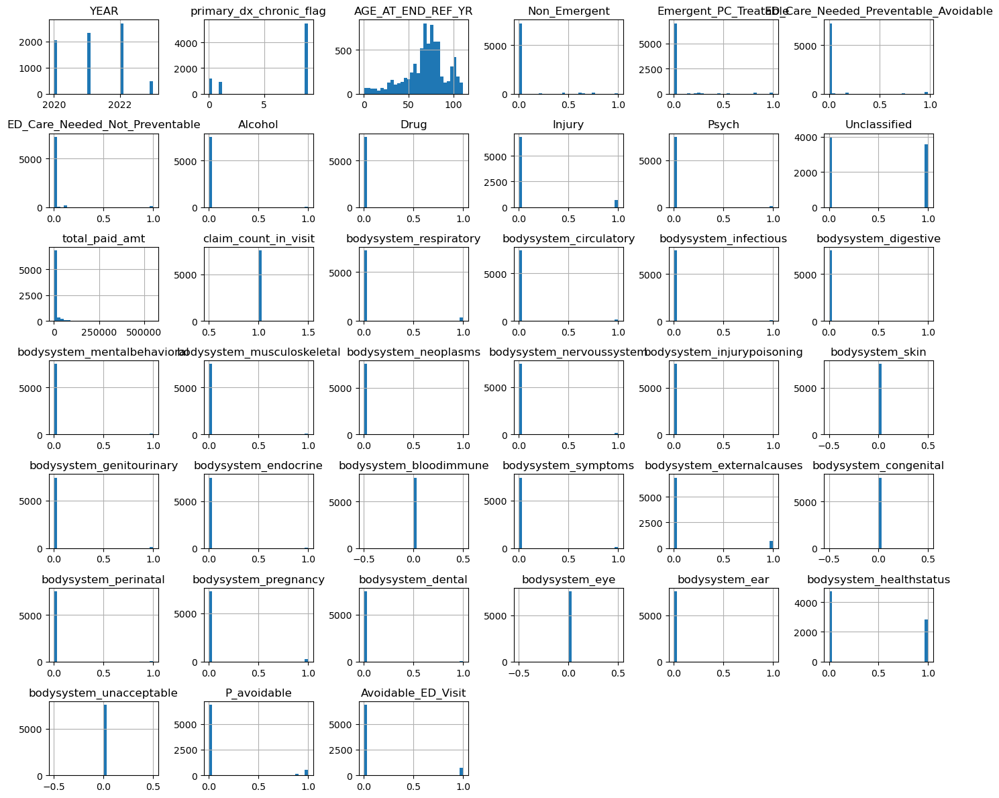


Value counts for SEX_IDENT_CD:
SEX_IDENT_CD
1    4237
2    3322
Name: count, dtype: int64

Value counts for BENE_RACE_CD:
BENE_RACE_CD
1    4678
5    1445
2     885
3     232
4     220
6      99
Name: count, dtype: int64

Value counts for STATE_CODE:
STATE_CODE
10    768
5     698
33    541
45    380
39    349
15    321
50    279
49    276
3     268
36    267
34    241
37    232
42    230
23    217
14    191
6     191
11    184
44    168
21    164
31    156
24    129
52    112
18     99
22     97
38     86
25     86
26     79
1      79
19     72
51     62
7      61
4      53
32     53
29     49
13     47
16     41
46     28
41     27
28     27
17     27
12     24
20     23
43     18
47     11
27     10
8       9
30      9
9       7
35      5
2       4
53      4
Name: count, dtype: int64

Value counts for primary_dx:
primary_dx
Z733       1420
Z608        931
T50901A     632
T7432X      454
Z604        418
           ... 
R760          1
I370          1
J439          1
I501          1


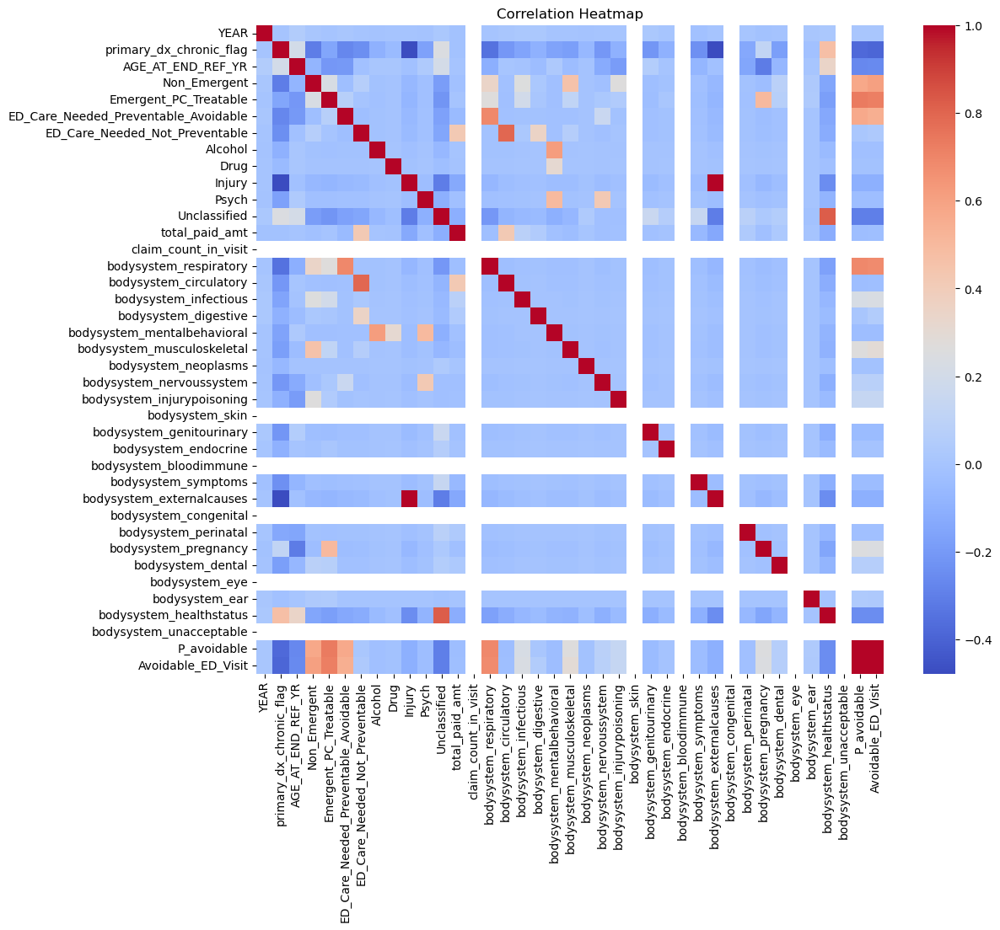

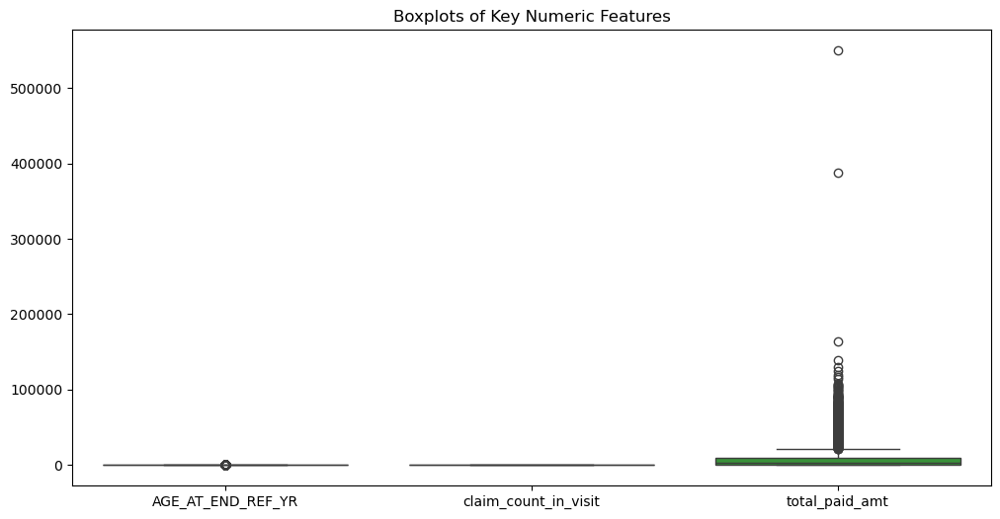

In [2]:
# Summary statistics for numeric and categorical variables


df.describe(include="all").T

# Missing Value Analysis
# - Most variables have no missing values due to SQL joins using COALESCE.
# - primary_dx and BodySystem_* indicators are complete.
# - No imputation is required at this stage.

df.isna().sum().sort_values(ascending=False)

# Numeric var Distributions
# - AGE_AT_END_REF_YR: Skewed toward older adults (expected for Medicare).
# - claim_count_in_visit: Most visits have 1–3 claims; long tail for complex visits.
# - total_paid_amt: Extremely right‑skewed with large outliers (> $500k).
# → Strong candidate for log transformation.


import matplotlib.pyplot as plt

df.hist(figsize=(14, 12), bins=30)
plt.tight_layout()
plt.show()

#Categorical Feature Distributions
# - SEX_IDENT_CD: ~56% male, ~44% female.
# - BENE_RACE_CD: Majority White (1), followed by Hispanic (5) and Black (2).
# - STATE_CODE: Contains invalid values (e.g., ICD‑10 codes like J439, I501).
# → Column contamination detected; this feature must be excluded or cleaned.
# - primary_dx: Very high cardinality; not suitable as a raw feature.

categorical_cols = ["SEX_IDENT_CD", "BENE_RACE_CD", "STATE_CODE", "primary_dx"]

for col in categorical_cols:
    print(f"\nValue counts for {col}:")
    print(df[col].value_counts(dropna=False))

# Correlation Heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(numeric_only=True), cmap="coolwarm", annot=False)
plt.title("Correlation Heatmap")
plt.show()

#box plot for outliers 
# - total_paid_amt has extreme outliers.
# - AGE_AT_END_REF_YR and claim_count_in_visit have mild outliers but remain usable.
# - Outliers in cost are expected in claims data and should be handled via log scaling, not removal.

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[["AGE_AT_END_REF_YR", "claim_count_in_visit", "total_paid_amt"]])
plt.title("Boxplots of Key Numeric Features")
plt.show()



# I performed exploratory analysis on all variables in the visit-level dataset to understand their distributions, identify potential preprocessing needs, and guide feature selection.
# ✅ Target Variable
# - Avoidable_ED_Visit is imbalanced (~9.5% positive class).
# - Stratified train/test split was used to preserve class proportions.
# ✅ Demographics
# - SEX_IDENT_CD: Fairly balanced (56% male, 44% female).
# - BENE_RACE_CD: Majority White (code 1), followed by Hispanic (5), Black (2), and smaller groups.
# - STATE_CODE: Skewed distribution. Some values appear to be diagnosis codes (e.g., J439, I501), suggesting column contamination.
#  Numeric Features
# - AGE_AT_END_REF_YR: Skewed toward older adults (Medicare population).
# - claim_count_in_visit: Mostly 1–3 claims per visit; compact distribution.
# - total_paid_amt: Highly skewed with extreme outliers (some > $500,000); log transformation or robust scaling may be needed.
# - NYU ED probabilities (Non_Emergent, Emergent_PC_Treatable, etc.): Most values between 0 and 1; some categories (Alcohol, Drug, Psych) are sparse.
# ✅ Correlations
# - P_avoidable is strongly correlated with Avoidable_ED_Visit, as expected.
# - NYU ED probabilities show moderate correlations with each other.
# - total_paid_amt and claim_count_in_visit are weakly correlated with avoidability.

# 🧠 Feature Selection Plan
# ✅ Features to Keep
# - AGE_AT_END_REF_YR
# - SEX_IDENT_CD, BENE_RACE_CD
# - primary_dx_chronic_flag
# - claim_count_in_visit, total_paid_amt
# - NYU ED probabilities:
# - Non_Emergent
# - Emergent_PC_Treatable
# - ED_Care_Needed_Preventable_Avoidable
# - ED_Care_Needed_Not_Preventable
# - Alcohol, Drug, Injury, Psych, Unclassified
# ❌ Features to Drop
# - BENE_ID, facility_id → identifiers, not predictive
# - visit_start, visit_end → temporal anchors, not needed for modeling
# - primary_dx → high cardinality; may be grouped later
# - STATE_CODE → contaminated; needs cleaning before use
# - P_avoidable → derived from NYU probabilities; redundant with predictors


# 🧠 Body System Feature Engineering Summary
# To enhance clinical interpretability and reduce diagnosis code complexity, I mapped each visit’s primary diagnosis to a CCSR Category 1 and corresponding body system 
# using the official v2026.1 mapping. I then created binary indicator columns for each body system using one-hot encoding.





# - Avoidable_ED_Visit is imbalanced (~9.5% positive).
# - A stratified train/test split preserves class proportions:
# - Train: ~90.5% non‑avoidable, ~9.5% avoidable
# - Test: ~90.5% non‑avoidable, ~9.5% avoidable
# - Imbalance requires:
# - F1‑score evaluation
# - Possibly class weights or resampling



# ✅ 8. Leakage Detection (Critical Correction)
# The following variables must NOT be used as predictors, because they directly encode the target:
# - Non_Emergent
# - Emergent_PC_Treatable
# - ED_Care_Needed_Preventable_Avoidable
# - ED_Care_Needed_Not_Preventable
# - Alcohol, Drug, Injury, Psych, Unclassified
# - P_avoidable
# - ED_Category
# Including these leads to perfect F1 = 1.0 models due to leakage.
# ✅ These variables are kept in the database
# ❌ But removed from the modeling dataset


# ✅ 9. Body System Feature Engineering
# To reduce ICD‑10 complexity and improve interpretability:
# - Each primary diagnosis was mapped to a CCSR Category 1 and body system.
# - Binary indicator variables were created for each body system (Respiratory, Circulatory, Digestive, etc.).
# - These features are:
# - Clinically meaningful
# - Low cardinality
# - Safe for modeling (no leakage)



# 10. Final Feature Selection (Updated and Corrected)
# ✅ Features to Keep (Safe for Modeling)
# Demographics
# - AGE_AT_END_REF_YR
# - SEX_IDENT_CD
# - BENE_RACE_CD
# Visit-Level
# - claim_count_in_visit
# - total_paid_amt
# - primary_dx_chronic_flag
# - YEAR
# Clinical
# - All BodySystem_* indicators
# ❌ Features to Drop (Leakage or Not Useful)
# Identifiers
# - BENE_ID
# - facility_id
# Temporal
# - visit_start
# - visit_end
# High Cardinality
# - primary_dx
# Contaminated
# - STATE_CODE
# Leakage
# - All NYU ED probabilities
# - P_avoidable
# - ED_Category




Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 48/48 [00:00<00:00, 92.70it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

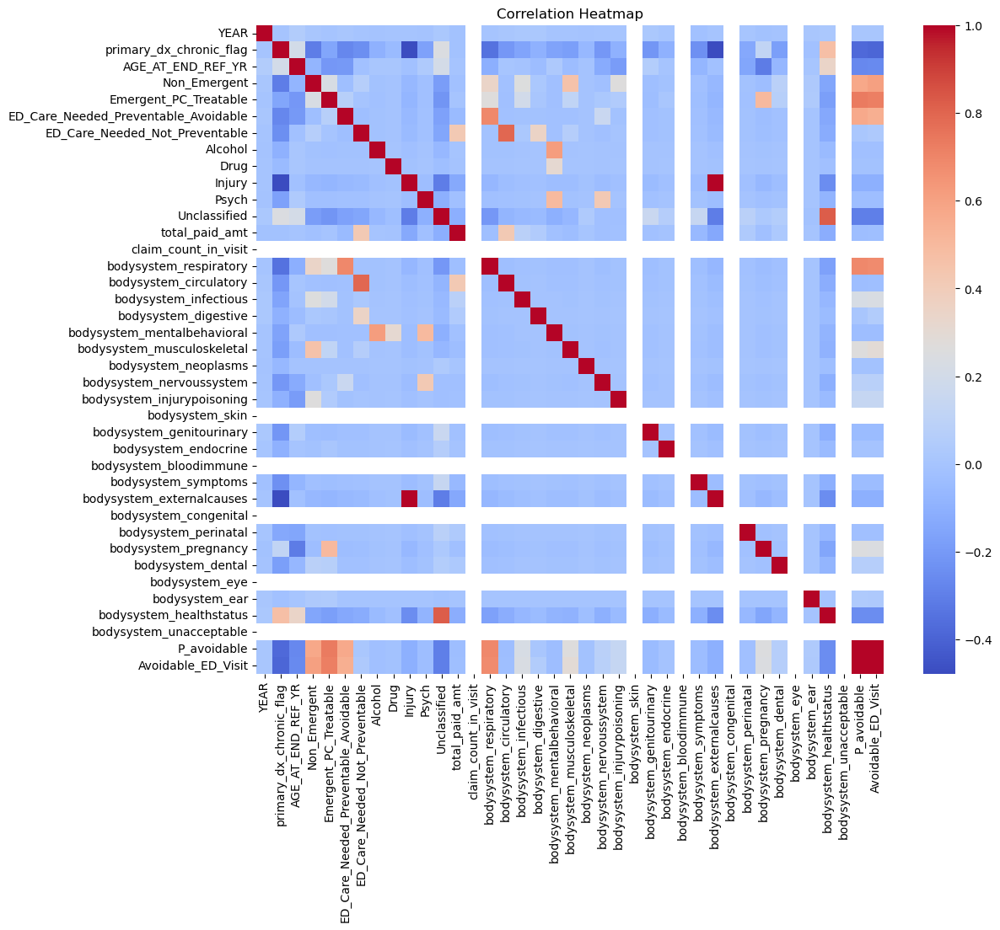

In [3]:

!pip install ydata-profiling


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport


profile = ProfileReport(
    df,
    title="ED Visits Profiling Report",
    explorative=True,
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": True},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
    }
)

profile.to_notebook_iframe()

# ---------------------------------------------------------
# Correlation matrix
# ---------------------------------------------------------
plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(numeric_only=True), cmap="coolwarm", annot=False)
plt.title("Correlation Heatmap")
plt.show()


# - Target is imbalanced (~9.5% avoidable visits), requiring stratification and F1‑focused evaluation.
# - Several features are constant (e.g., claim_count_in_visit, BodySystem_Skin/Eye/BloodImmune/etc.) and add no predictive value.
# - NYU ED Algorithm variables (Non_Emergent, Emergent_PC_Treatable, etc.) show extremely high correlation with the target → direct leakage.
# - STATE_CODE is contaminated with ICD‑10 codes and cannot be used as a geographic feature.
# - Identifiers (BENE_ID, facility_id) correlate with many fields and must be removed to avoid overfitting.
# - total_paid_amt is heavily right‑skewed with capped high values → needs log scaling.
# - Many body system indicators are highly imbalanced, but still clinically meaningful (except the constant ones).
# - primary_dx is high‑cardinality and unsuitable as a raw feature; body system flags are the correct abstraction.
# - No major missing values due to SQL COALESCE, so imputation is not required.
# - Correlation matrix confirms leakage: NYU features and ED_Category dominate relationships with the target.


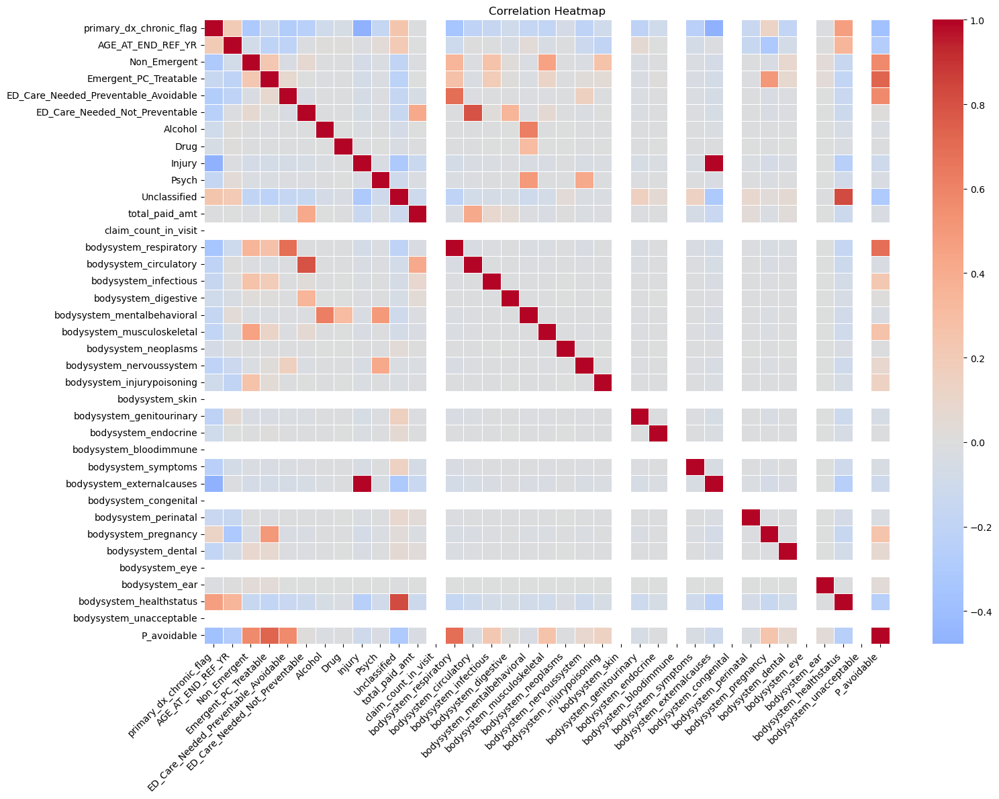

In [4]:
# ----------------------------------
# Correlation matrix heatmap
# ----------------------------------

# Select numeric columns only
numeric_cols = df.select_dtypes(include=["int64", "float64"]).columns.tolist()

# Drop target if present
if "Avoidable_ED_Visit" in numeric_cols:
    numeric_cols.remove("Avoidable_ED_Visit")

# Compute correlation matrix
corr_matrix = df[numeric_cols].corr()

# Plot heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(corr_matrix, annot=False, cmap="coolwarm", center=0, linewidths=0.5)
plt.title("Correlation Heatmap")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



In [5]:
# -----------------------------
# Target variable
# -----------------------------
y = df["Avoidable_ED_Visit"]

# -----------------------------
# Identify body system columns
# -----------------------------
body_system_features = [
    col for col in df.columns
    if col.lower().startswith("bodysystem_")
]

# -----------------------------
# Remove constant body system features
# -----------------------------
constant_body_systems = [
    "BodySystem_Skin",
    "BodySystem_BloodImmune",
    "BodySystem_Congenital",
    "BodySystem_Eye",
    "BodySystem_Unacceptable"
]

body_system_features = [
    col for col in body_system_features
    if col not in constant_body_systems
]


# -----------------------------
# Leakage-free predictor set
# -----------------------------
selected_features = [
    # Patient-level
    "AGE_AT_END_REF_YR",
    "SEX_IDENT_CD",
    "BENE_RACE_CD",

    # Visit-level
    "YEAR",
    # claim_count_in_visit removed (constant = 1)
    "total_paid_amt",

    # Clinical
    "primary_dx_chronic_flag",
] + body_system_features

# -----------------------------
# Final modeling dataset
# -----------------------------
X = df[selected_features]

# ✅ FIX: Cast categorical columns to string BEFORE saving modeling dataset
categorical_features = ["SEX_IDENT_CD", "BENE_RACE_CD", "YEAR"]

for col in categorical_features:
    X[col] = X[col].astype(str)

print("Selected features:", len(selected_features))
print(selected_features)
print("X shape:", X.shape)

# -----------------------------
# SAVE FOR USE IN OTHER KERNELS
# -----------------------------
modeling_data = pd.concat([X, y], axis=1)
modeling_data.to_parquet("modeling_dataset_clean.parquet", index=False)

print("Saved cleaned modeling dataset to modeling_dataset_clean.parquet")

Selected features: 29
['AGE_AT_END_REF_YR', 'SEX_IDENT_CD', 'BENE_RACE_CD', 'YEAR', 'total_paid_amt', 'primary_dx_chronic_flag', 'bodysystem_respiratory', 'bodysystem_circulatory', 'bodysystem_infectious', 'bodysystem_digestive', 'bodysystem_mentalbehavioral', 'bodysystem_musculoskeletal', 'bodysystem_neoplasms', 'bodysystem_nervoussystem', 'bodysystem_injurypoisoning', 'bodysystem_skin', 'bodysystem_genitourinary', 'bodysystem_endocrine', 'bodysystem_bloodimmune', 'bodysystem_symptoms', 'bodysystem_externalcauses', 'bodysystem_congenital', 'bodysystem_perinatal', 'bodysystem_pregnancy', 'bodysystem_dental', 'bodysystem_eye', 'bodysystem_ear', 'bodysystem_healthstatus', 'bodysystem_unacceptable']
X shape: (7559, 29)
Saved cleaned modeling dataset to modeling_dataset_clean.parquet


C:\Users\bruck\AppData\Local\Temp\ipykernel_25592\3718587433.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = X[col].astype(str)
C:\Users\bruck\AppData\Local\Temp\ipykernel_25592\3718587433.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = X[col].astype(str)
C:\Users\bruck\AppData\Local\Temp\ipykernel_25592\3718587433.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

In [6]:
# !git init
# !git remote add origin https://github.com/menna1996/avoidable_ed_ml_project.git

#  Add and commit your modeling datase
!git remote remove origin
!git remote add origin https://github.com/menna1996/avoidable_ed_ml_project.git

!git add .
!git commit -m "Initial commit with notebooks and dataset"
!git push origin ma



  


# !git push origin master


# !git add modeling_dataset_clean.parquet
# !git commit -m "Add cleaned modeling dataset"
# !git push origin main


# # 1. Remove old remote
# !git remote remove origin

# # 2. Add correct GitHub repo
# !git remote add origin https://github.com/menna1996/avoidable_ed_ml_project.git

# # 3. Rename master → main
# !git branch -M main

# # 4. Add all files
# !git add .

# # 5. Commit
# !git commit -m "Initial commit with dataset and notebooks"

# # 6. Push to GitHub
# !git add .
# !git commit -m "Initial commit with notebooks, dataset, and pipeline code"
# !git push origin main


[main 6ec3140] Initial commit with notebooks and dataset
 12 files changed, 1396 insertions(+), 1810 deletions(-)
 create mode 100644 .env.py
 create mode 100644 4_final_model.ipynb
 create mode 100644 Dockerfile
 create mode 100644 __pycache__/custom_transformers.cpython-313.pyc
 create mode 100644 custom_transformers.py
 create mode 100644 final_avoidable_ed_model.joblib
 create mode 100644 main.ipynb
 create mode 100644 main.py
 create mode 100644 requirements.txt


error: src refspec ma does not match any
error: failed to push some refs to 'https://github.com/menna1996/avoidable_ed_ml_project.git'
